In [1]:
# channel
# 
# Band 1: SAR image, VV
# Band 2: SAR image, VH
# Band 3: Merit DEM
# Band 4: Copernicus DEM
# Band 5: ESA World Cover Map
# Band 6: Water occurrence probability

# 1,2 偏振0-1，0-？
# 3，4 高度 0-卫星高度
# 5 rgb 地图？
# 水没率

In [1]:
import PIL
from PIL import Image
import glob
from glob import glob
import cv2
import numpy as np
import tifffile
from tifffile import TiffFile
import matplotlib.pyplot as plt
import rasterio



# PATH

In [2]:
DATASET_ROOT='/home/syo/work/2024_IEEE_GRSS/dataset/'
TRACK1_ROOT='/home/syo/work/2024_IEEE_GRSS/dataset/Track1/'
TRACK2_ROOT='/home/syo/work/2024_IEEE_GRSS/dataset/Track2/'

In [3]:
images_list=sorted([i for i in glob(TRACK1_ROOT+'train/images/'+'*')])
label_list=sorted([i for i in glob(TRACK1_ROOT+'train/labels/'+'*')])

In [4]:
len(images_list)

1631

In [20]:
sample=images_list[0]
#print(data.shape)
with TiffFile(sample) as tif:
    img=tif.asarray()
    metadata = tif.pages[0].tags
    print(tif.pages[0].tags)
    print(img.dtype)
    print(img.shape)
    

TiffTag 256 ImageWidth @3149208 SHORT @3149216 = 512
TiffTag 257 ImageLength @3149220 SHORT @3149228 = 512
TiffTag 258 BitsPerSample @3149232 SHORT[6] @3149356 = (16, 16, 16, 16, 16, 16)
TiffTag 259 Compression @3149244 SHORT @3149252 = NONE
TiffTag 262 PhotometricInterpretation @3149256 SHORT @3149264 = MINISBLACK
TiffTag 273 StripOffsets @3149268 LONG[512] @3150392 = (3478, 9622, 15766, 2191
TiffTag 277 SamplesPerPixel @3149280 SHORT @3149288 = 6
TiffTag 278 RowsPerStrip @3149292 SHORT @3149300 = 1
TiffTag 279 StripByteCounts @3149304 SHORT[512] @3149368 = (6144, 6144, 6144, 6
TiffTag 284 PlanarConfiguration @3149316 SHORT @3149324 = CONTIG
TiffTag 338 ExtraSamples @3149328 SHORT[5] @3152440 = ('UNSPECIFIED', 'UNSPECIF
TiffTag 339 SampleFormat @3149340 SHORT[6] @3152450 = ('INT', 'INT', 'INT', 'IN
int16
(512, 512, 6)


In [22]:
sample=images_list[0]
image = tifffile.imread(sample, dtype=np.uint16)
print(image)

[[[   65    13 -9999     0    80    98]
  [   31    10 -9999     0    80    98]
  [   71    15 -9999     0    80    99]
  ...
  [   37    22 -9999     0    80    99]
  [   35    10 -9999     0    80    99]
  [   48    10 -9999     0    80    99]]

 [[   63    20 -9999     0    80    98]
  [   33    18 -9999     0    80    98]
  [   86    29 -9999     0    80    98]
  ...
  [   27    24 -9999     0    80    99]
  [   29    21 -9999     0    80    99]
  [   22    35 -9999     0    80    99]]

 [[   68    24 -9999     0    80    98]
  [   41    31 -9999     0    80    98]
  [   77    35 -9999     0    80    98]
  ...
  [   15    43 -9999     0    80    99]
  [   26    45 -9999     0    80    99]
  [   48    52 -9999     0    80    99]]

 ...

 [[   80    12 -9999     0    80    98]
  [   74    18 -9999     0    80    98]
  [   80    13 -9999     0    80    98]
  ...
  [   29    31 -9999     0    80    99]
  [   68    17 -9999     0    80    99]
  [  153    24 -9999     0    80    99]]

 [

In [10]:
sample

'/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/0.tif'

In [11]:
img.shape

(512, 512, 6)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


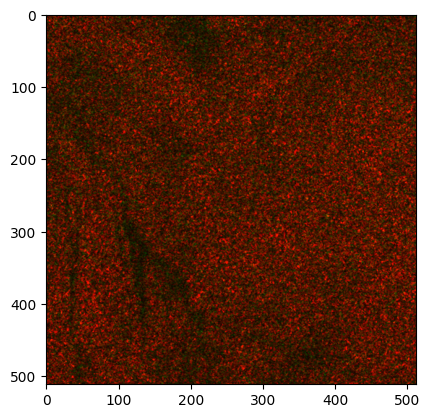

In [12]:

plt.imshow(img[:,:,0:3])

In [13]:
def display_sar(sar_data,num):
    sar_channels = [sar_data.read(i) for i in range(1, num+1)]
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    for i, ax in enumerate(axs.flatten()):
        ax.imshow(sar_channels[i], cmap='gray')
        ax.set_title(f'Channel {i + 1}')
        ax.axis('off')
    plt.show()

[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(512, 512)


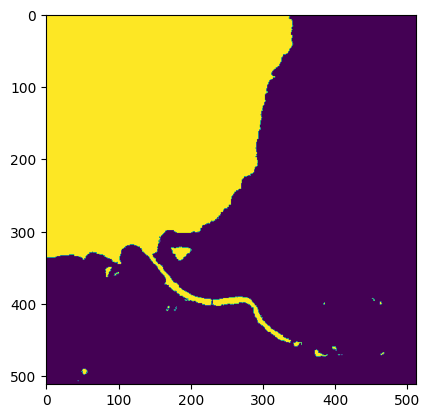

In [14]:
sample_map=np.array(Image.open(label_list[3]))
print(sample_map)
plt.imshow(sample_map)
print(sample_map.shape)

/home/syo/opt/mambaforge/envs/kaggle/lib/python3.11/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


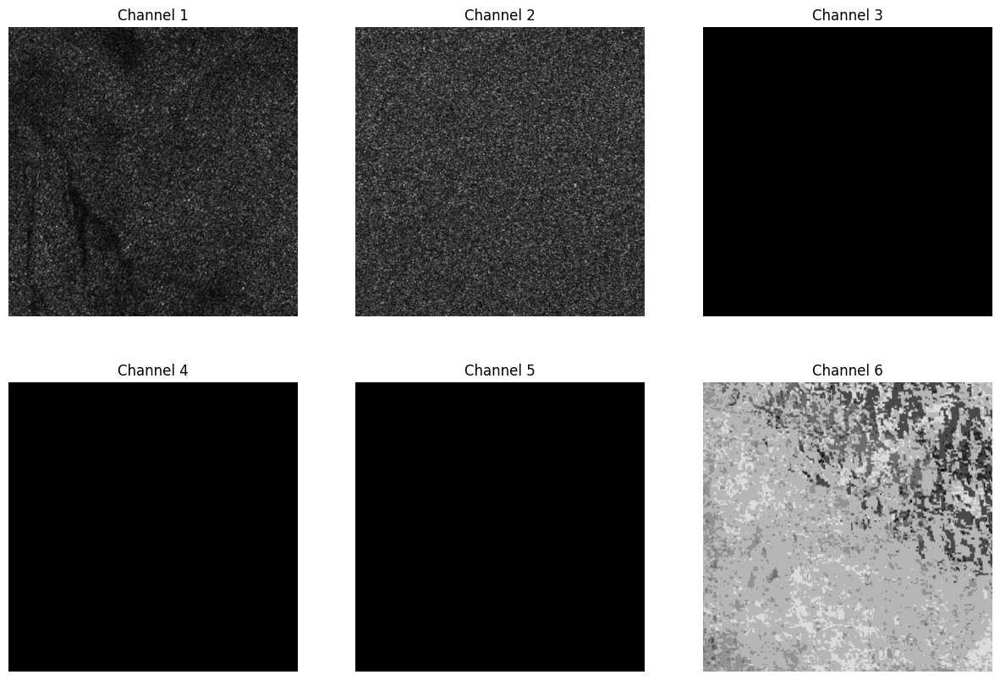

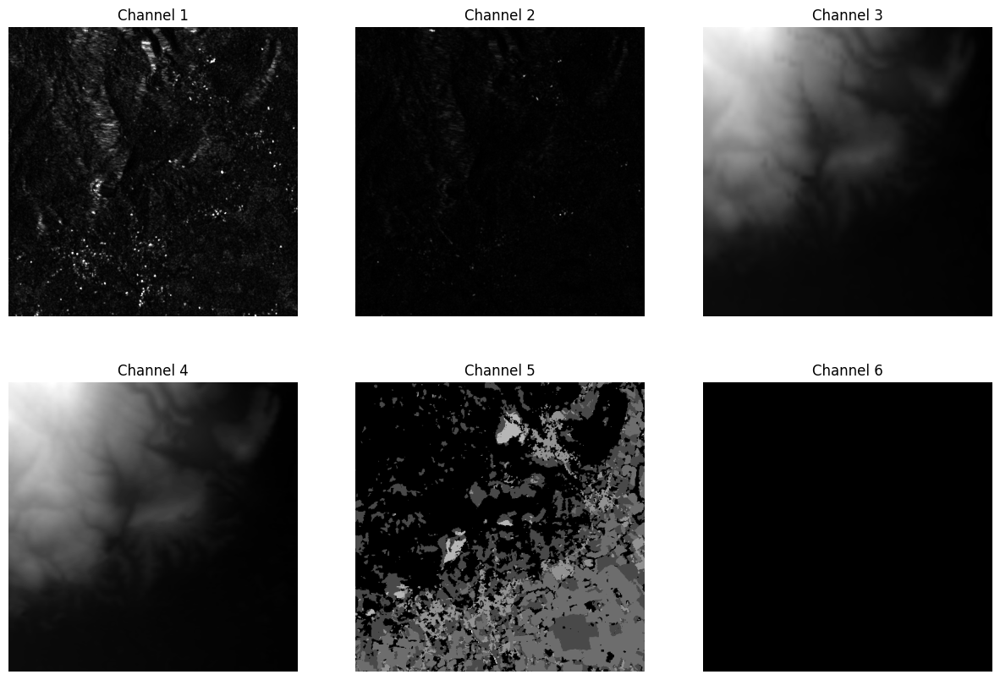

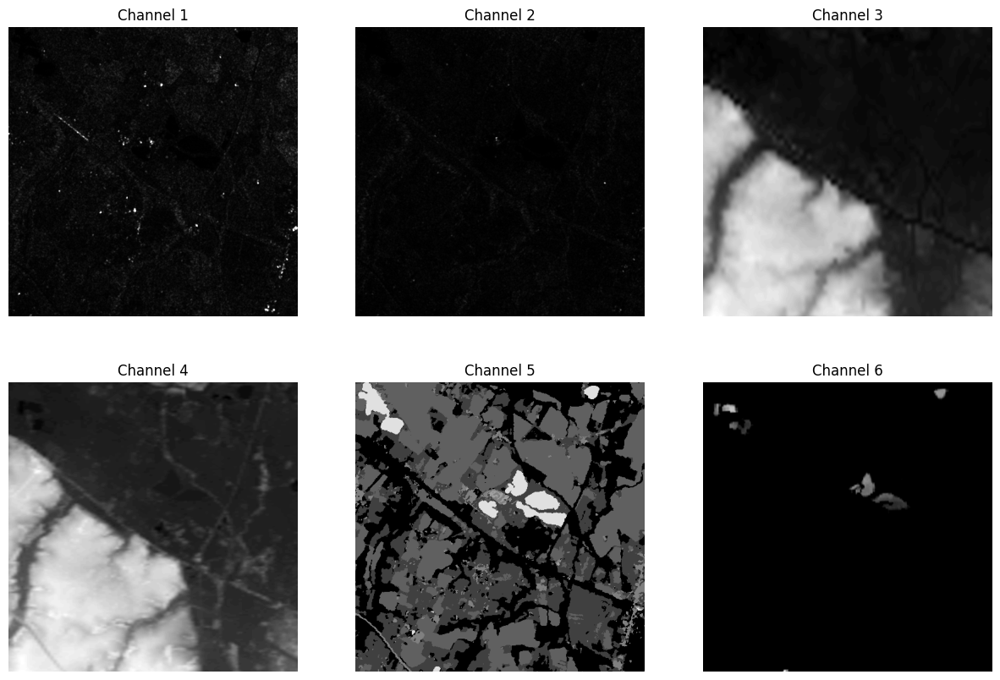

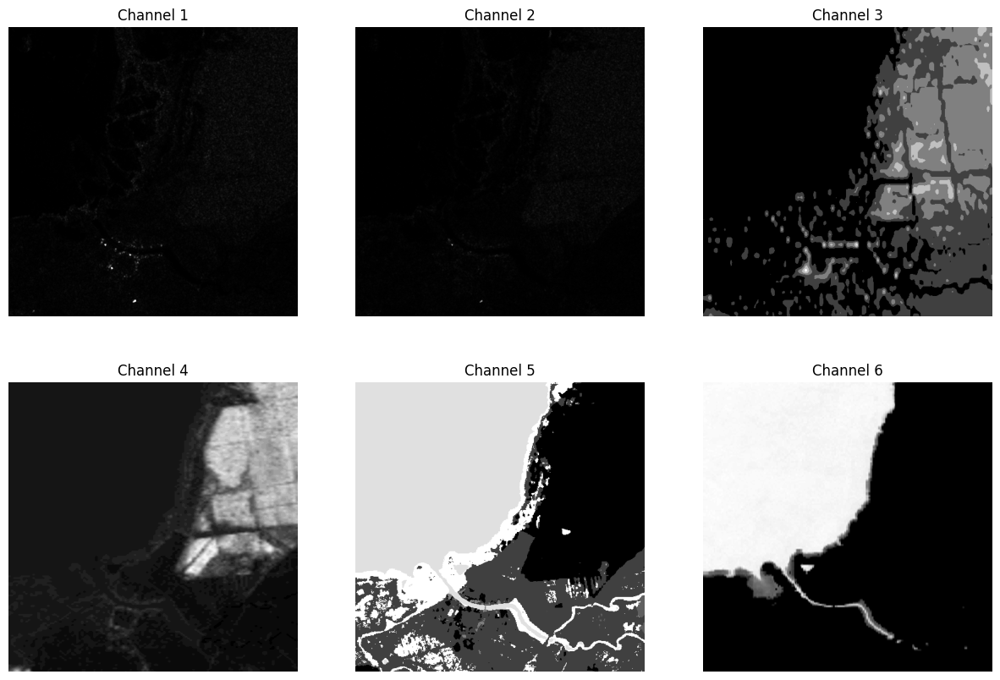

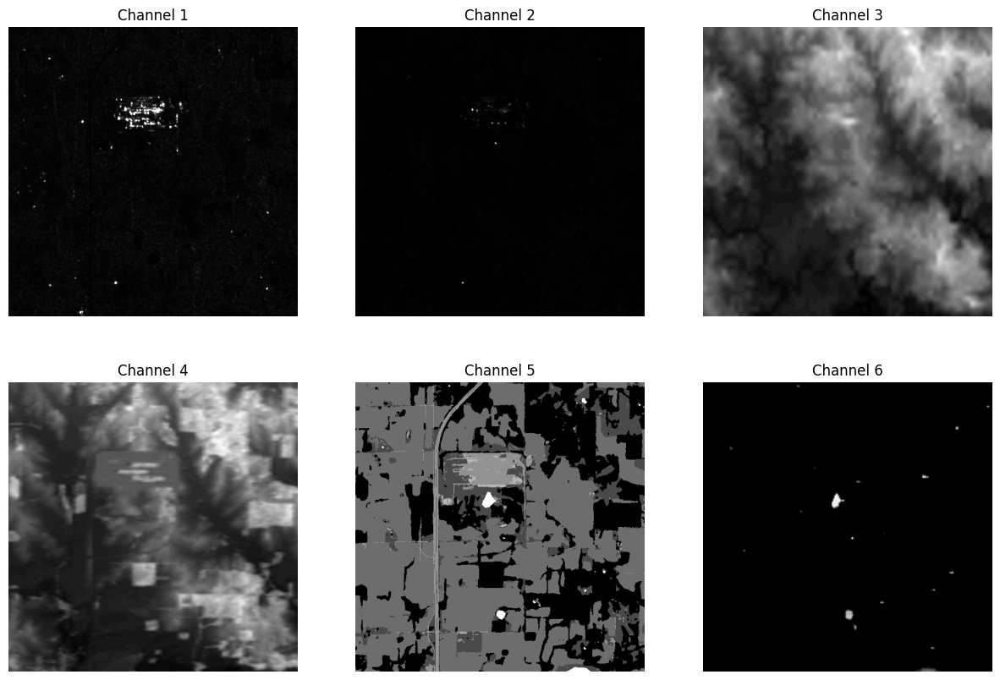

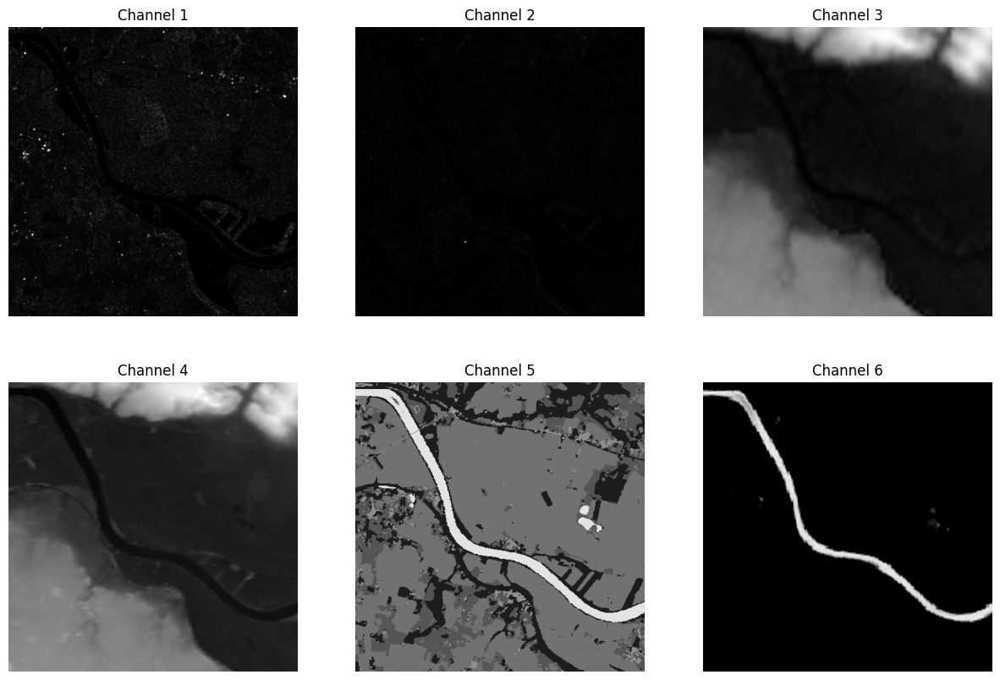

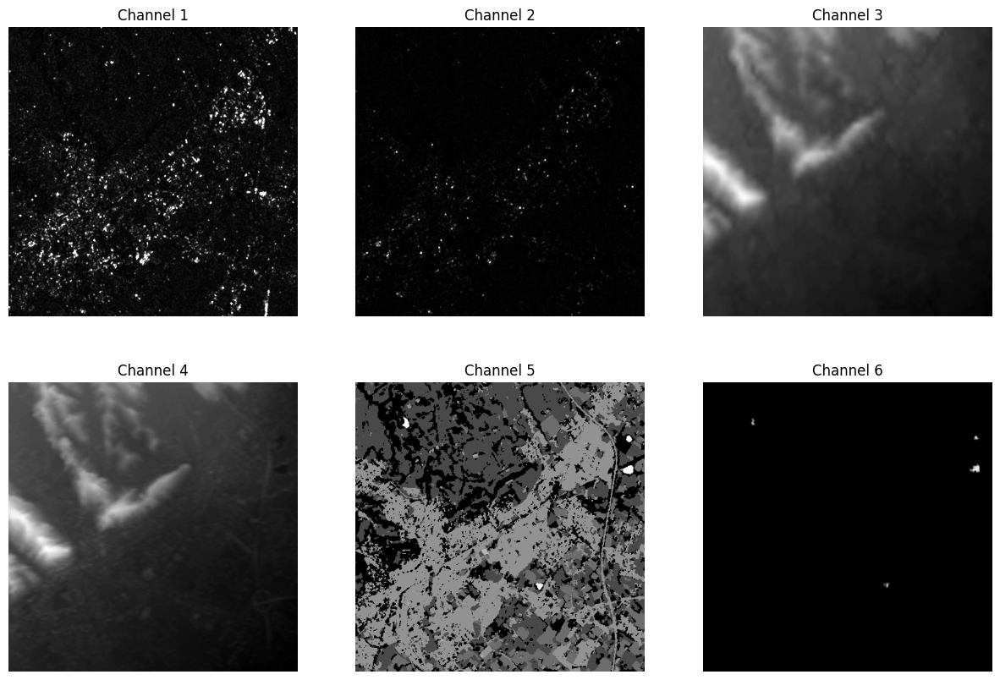

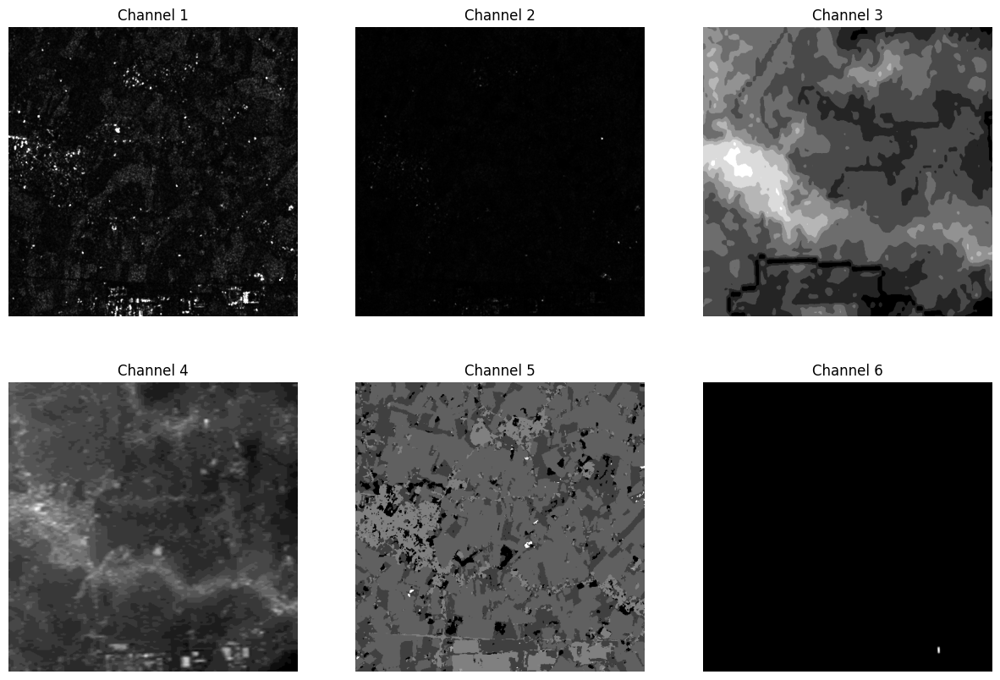

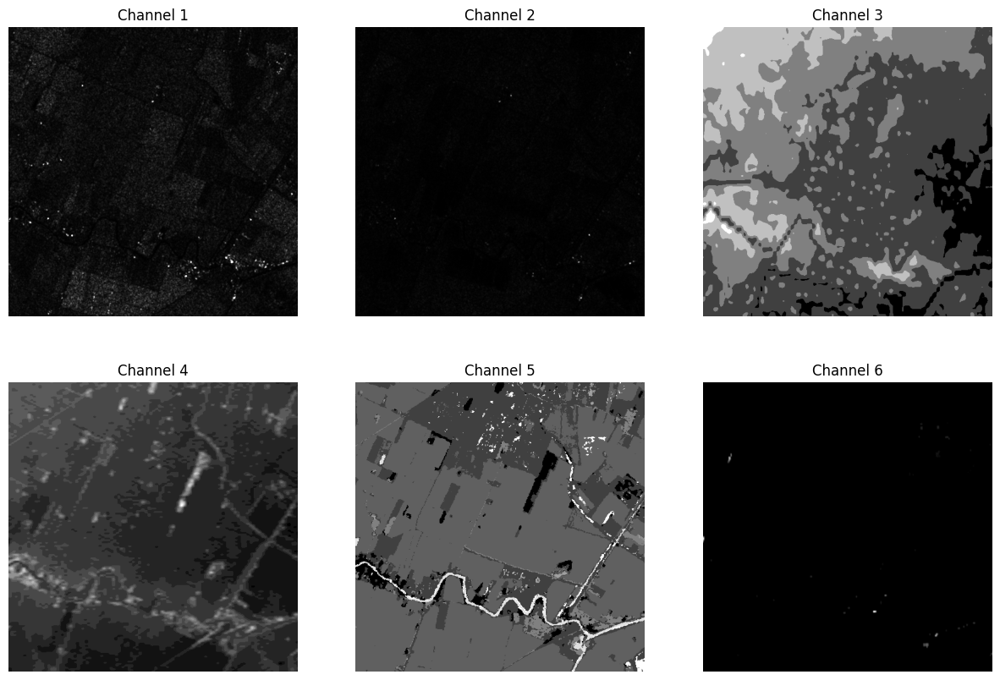

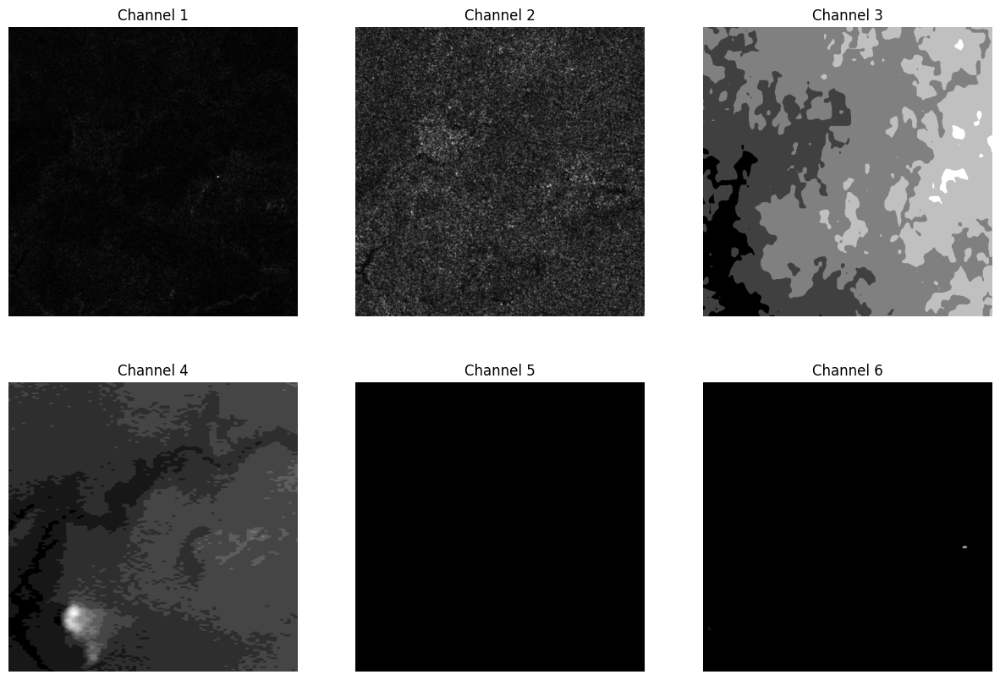

In [20]:
for i in images_list[:10]:
    sar_data = rasterio.open(i,dtype=rasterio.uint16)
    display_sar(sar_data=sar_data,num=6)

In [16]:
from dataset import SARDataset

In [17]:
train_dataset=SARDataset(
       image_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/",
       label_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/labels/",
       mode='train'
   )
val_dataset=SARDataset(
       image_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/",
       label_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/labels/",
       mode='val'
   )

In [18]:
n_max=[]
n_min=[]
for data in train_dataset:
    d=data['data']
    c1=d[0,:,:]
    n_max.append(c1.max())
    n_min.append(c1.min())

    #negative_indices = np.where(d < 0)
    #negative_count = len(negative_indices[0])
    #negative_values = d[negative_indices]
    #print(negative_count)
    #print(negative_values)
n_max=np.array(n_max)
n_min=np.array(n_min)
print(sorted(n_max))
print(sorted(n_min))


KeyboardInterrupt: 

# submit visualization test

In [2]:
submit_path='./submit/'
submaks_list = sorted(list(glob(submit_path+'*')))

./submit/1631.png
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 

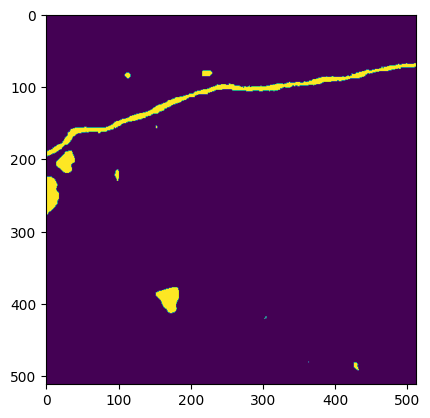

In [3]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

sample_map=np.array(Image.open(submaks_list[35]))
print(submaks_list[0])
print(sample_map)
plt.imshow(sample_map)
print(sample_map.shape)

# albumentations test

In [2]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from dataset import SARDataset
from torch.utils.data import Dataset,DataLoader
import matplotlib.pyplot as plt
import rasterio

/home/syo/opt/mambaforge/envs/kaggle/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
def display_sar(sar_data,num=6):
    fig, axs = plt.subplots(2, 3, figsize=(30, 20))
    for i, ax in enumerate(axs.flatten()):
        print(sar_data)
        ax.imshow(sar_data[i], cmap='gray')
        ax.set_title(f'Channel {i + 1}')
        ax.axis('off')
    #plt.show()

In [41]:
data_transforms = {
    "train": A.Compose(
        [
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.OneOf(
                [
                    A.Rotate(limit=90),
                    A.Rotate(limit=-90),
                    A.Rotate(limit=180),
                    A.Rotate(limit=-180),
                ],
                p=0.5,
            ),
            A.RandomResizedCrop(p=0.2, width=512, height=512),
            A.OneOf([A.GridDistortion(), A.OpticalDistortion()], p=0.2),
            A.OneOf(
                [
                    A.GaussianBlur(),
                    A.GaussNoise(var_limit=(0, 2e-8), mean=0, per_channel=True),
                ],
                p=0.2,
            ),
            # ToTensorV2(),
        ],
        p=1.0,
    ),
}

In [42]:
train_dataset=SARDataset(
    image_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/",
    label_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/labels/",
    mode='train',
    val_size=1e-10,
    data_transforms=data_transforms['train']
    )

tensor([[[0.1532, 0.1512, 0.1493,  ..., 0.0630, 0.0666, 0.0670],
         [0.1678, 0.1643, 0.1606,  ..., 0.0677, 0.0718, 0.0724],
         [0.1919, 0.1849, 0.1759,  ..., 0.0751, 0.0802, 0.0810],
         ...,
         [0.0573, 0.0572, 0.0574,  ..., 0.0402, 0.0358, 0.0340],
         [0.0618, 0.0637, 0.0674,  ..., 0.0354, 0.0338, 0.0332],
         [0.0640, 0.0667, 0.0718,  ..., 0.0329, 0.0325, 0.0324]],

        [[0.0226, 0.0218, 0.0192,  ..., 0.0054, 0.0052, 0.0052],
         [0.0202, 0.0195, 0.0172,  ..., 0.0052, 0.0050, 0.0051],
         [0.0148, 0.0142, 0.0127,  ..., 0.0050, 0.0050, 0.0051],
         ...,
         [0.0191, 0.0195, 0.0199,  ..., 0.0106, 0.0096, 0.0090],
         [0.0191, 0.0197, 0.0206,  ..., 0.0090, 0.0079, 0.0073],
         [0.0195, 0.0202, 0.0211,  ..., 0.0087, 0.0075, 0.0070]],

        [[0.5012, 0.5012, 0.5012,  ..., 0.5047, 0.5047, 0.5047],
         [0.5012, 0.5012, 0.5012,  ..., 0.5047, 0.5047, 0.5047],
         [0.5011, 0.5011, 0.5011,  ..., 0.5047, 0.5047, 0.

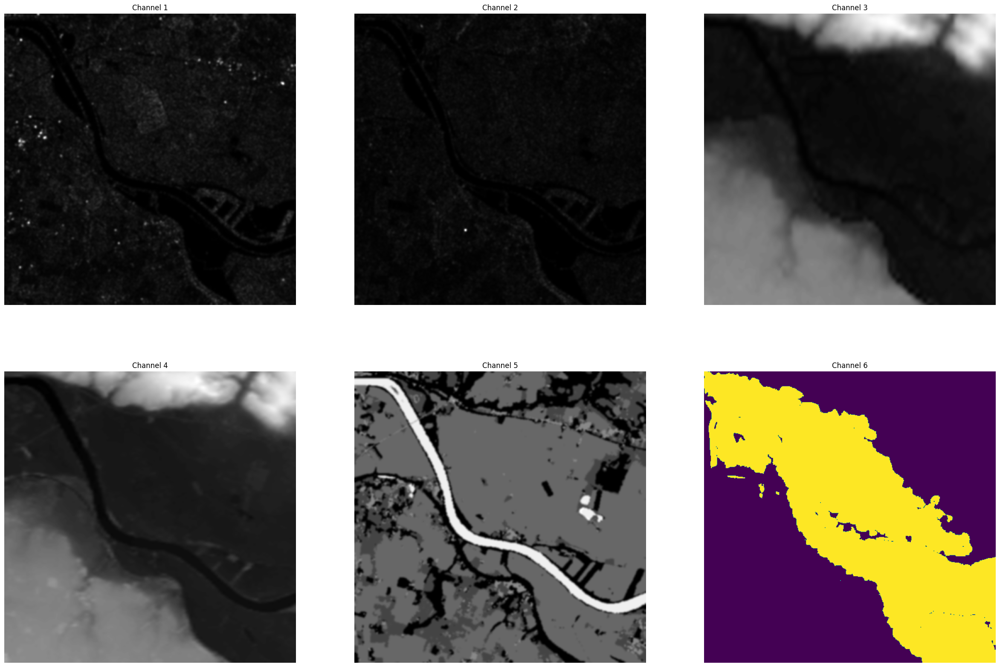

In [43]:
k=0
for i in train_dataset:
    k+=1
    if k==6:
        display_sar(i['data'])
        print(i['label'][2])
        plt.imshow(i['label'])
        break
    else:
        continue

In [13]:
train_dataset=SARDataset(
    image_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/",
    label_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/labels/",
    mode='train',
    val_size=1e-10,
    #data_transforms=data_transforms['train']
    )

In [ ]:
k=0
for i in train_dataset:
    k+=1
    if k==6:
        display_sar(i['data'])
        print(i['label'])
        plt.imshow(i['label'])
        break
    else:
        continue

# dataset

In [1]:
from dataset import SARDataset

/home/syo/opt/mambaforge/envs/kaggle/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
train_dataset=SARDataset(
       image_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/",
       label_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/labels/",
       mode='train'
   )

In [3]:
for j in range(6):
    nmin=1e10
    nmax=-1e10
    for i in train_dataset:
        a=i['data'][j]
        nmin=min(nmin,a.min())
        nmax=max(nmax,a.max())
    print(nmin,nmax)

/home/syo/opt/mambaforge/envs/kaggle/lib/python3.11/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


tensor(0.) tensor(1.)
tensor(0.) tensor(1.)
tensor(0.) tensor(0.6615)
tensor(0.4983) tensor(0.6601)
tensor(0.) tensor(1.)
tensor(0.) tensor(1.)


In [ ]:
valid_dataset=SARDataset(
       image_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/",
       label_root="/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/labels/",
       mode='val')

for j in range(6):
    nmin=1e10
    nmax=-1e10
    for i in valid_dataset:
        a=i['data'][j]
        nmin=min(nmin,a.min())
        nmax=max(nmax,a.max())
    print(nmin,nmax)

In [ ]:
# normalization
# channel
# 1: 0-32765        x/32765
# 2:                x/32765
# 3: -9999:9999     (x+9999)/(9999*2)
# 4: -9999:9999     (x+9999)/(9999*2)
# 5: 0-100          x/100
# 6: 0-255          x/255


# tta

In [1]:
import torch
from torch.utils.data import Dataset,DataLoader
from glob import glob
from sklearn.model_selection import train_test_split
import ipdb
import rasterio
from PIL import Image
import numpy as np
from tqdm.auto import tqdm
from model import WrapperModel
from dataset import SARDataset
import segmentation_models_pytorch as smp
import torch.nn.functional as F
import pathlib
import os
from torch import nn
import albumentations as A
import matplotlib.pyplot as plt

NORMALIZATION=True
def _sar_normalization(sar_data):
    """
        normalize the data to (0, 1).

        Band 1: SAR image, VV
        Band 2: SAR image, VH
        Band 3: Merit DEM
        Band 4: Copernicus DEM
        Band 5: ESA World Cover Map
        Band 6: Water occurrence probability

        # 1: 0-32765        x/32765
        # 2:                x/32765
        # 3: -9999:9999     (x+9999)/(9999*2)
        # 4: 0-100          x/100
        # 5: 0-255          x/255
    """
    sar_data=sar_data.astype(np.float32)
    sar_data[0]=sar_data[0]/32765
    sar_data[1]=sar_data[1]/32765
    sar_data[2]=(sar_data[2]+9999)/(9999*2)
    sar_data[3]=(sar_data[3]+9999)/(9999*2)
    sar_data[4]=sar_data[4]/100
    sar_data[5]=sar_data[5]/255
    return sar_data

/home/syo/opt/mambaforge/envs/kaggle/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
unet_pp=smp.create_model(arch='unetplusplus',classes=2,in_channels=6,encoder_name='timm-resnest269e', encoder_weights="imagenet")
model1=WrapperModel.load_from_checkpoint('/home/syo/work/2024_IEEE_GRSS/src/waterflow/cowfixb8/checkpoints/epoch=299-step=61200.ckpt',model=unet_pp,mode='test',map_location=torch.device("cuda"))
model1.eval()

WrapperModel(
  (model): UnetPlusPlus(
    (encoder): ResNestEncoder(
      (conv1): Sequential(
        (0): Conv2d(6, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
        (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): ResNestBottleneck(
          (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (

In [3]:

def display_sar(sar_data,num=6):
    sar_channels = [sar_data[i,:,:] for i in range(num)]
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    for i, ax in enumerate(axs.flatten()):
        ax.imshow(sar_channels[i], cmap='gray')
        ax.set_title(f'Channel {i + 1}')
        ax.axis('off')
    plt.show()

In [40]:
def _trans_vec(vec):
    vec=np.transpose(vec, (2, 0, 1))
    return vec

def tta(model,input_data):
    """
    input_data: batch_size, channel, w, h
    """

    print(input_data.shape)
    tta_out=[]
    input_data=np.transpose(input_data, (1, 2, 0))

    data_transforms = {
        "horizon": A.Compose([A.HorizontalFlip(p=1,),]),
        "vertical": A.Compose([A.VerticalFlip(p=1)]),
        "r90": A.Compose([A.Rotate(limit=(90,90),p=1)]),
        "rn90": A.Compose([A.Rotate(limit=(-90,-90),p=1)]),
        "rn180": A.Compose([A.Rotate(limit=(-180,-180),p=1)]),
    }

    horizon_fliped =    _trans_vec(data_transforms["horizon"](image=input_data)["image"])
    vertical_fliped =   _trans_vec(data_transforms["vertical"](image=input_data)["image"])
    r90 =               _trans_vec(data_transforms["r90"](image=input_data)["image"])
    rn90 =              _trans_vec(data_transforms["rn90"](image=input_data)["image"])
    rn180 =             _trans_vec(data_transforms["rn180"](image=input_data)["image"])
    raw_input =        _trans_vec(input_data)

    # raw
    input=torch.tensor(raw_input,dtype=torch.float32).unsqueeze(0).cuda()
    output=model.forward(input)
    output = F.softmax(output).squeeze(0)
    preds=output.detach().cpu().numpy()
    tta_out.append(preds)

    # horizon
    input=torch.tensor(horizon_fliped,dtype=torch.float32).unsqueeze(0).cuda()
    output=model.forward(input)
    output = F.softmax(output).squeeze(0)
    preds=output.detach().cpu().numpy()
    preds=np.transpose(preds, (1, 2, 0))    
    preds=_trans_vec(data_transforms['horizon'](image=preds)['image'])
    tta_out.append(preds)

    # vertical
    input=torch.tensor(vertical_fliped,dtype=torch.float32).unsqueeze(0).cuda()
    output=model.forward(input)
    output = F.softmax(output).squeeze(0)
    preds=output.detach().cpu().numpy()
    preds=np.transpose(preds, (1, 2, 0))    
    preds=_trans_vec(data_transforms['vertical'](image=preds)['image'])
    tta_out.append(preds)

    # 90
    input=torch.tensor(r90,dtype=torch.float32).unsqueeze(0).cuda()
    output=model.forward(input)
    output = F.softmax(output).squeeze(0)
    preds=output.detach().cpu().numpy()
    preds=np.transpose(preds, (1, 2, 0))    
    preds=_trans_vec(data_transforms['rn90'](image=preds)['image'])
    tta_out.append(preds)

    # -90
    input=torch.tensor(rn90,dtype=torch.float32).unsqueeze(0).cuda()
    output=model.forward(input)
    output = F.softmax(output).squeeze(0)
    preds=output.detach().cpu().numpy()
    preds=np.transpose(preds, (1, 2, 0))    
    preds=_trans_vec(data_transforms['r90'](image=preds)['image'])
    tta_out.append(preds)

    # -180
    input=torch.tensor(rn180,dtype=torch.float32).unsqueeze(0).cuda()
    output=model.forward(input)
    output = F.softmax(output).squeeze(0)
    preds=output.detach().cpu().numpy()
    preds=np.transpose(preds, (1, 2, 0))    
    preds=_trans_vec(data_transforms['rn180'](image=preds)['image'])
    tta_out.append(preds)

    # mean preds
    #print(len(tta_out))
    #fig, axes = plt.subplots(2, 3, figsize=(10, 6))
    #for i,ax in zip(tta_out,axes.flatten()):
    #    binary_map = (i[1,:,:] > 0.5).astype(np.uint8)
    #    ax.imshow(binary_map)
    
    mean_mask = np.mean(tta_out, axis=0)
    mean_mask=torch.tensor(mean_mask).unsqueeze(0).numpy()
    binary_map = (mean_mask[:,1,:,:] > 0.5).astype(np.uint8)[0]
    plt.imshow(binary_map, cmap='viridis') 

    #binary_map = (preds[1,:,:] > 0.5).astype(np.uint8)
    #print(binary_map.shape)
    #print(preds.shape)
    #plt.imshow(binary_map)

    display_sar(raw_input)
    display_sar(horizon_fliped)
    display_sar(vertical_fliped)
    display_sar(r90)
    display_sar(rn90)
    display_sar(rn180)

  0%|          | 0/349 [00:00<?, ?it/s]/home/syo/opt/mambaforge/envs/kaggle/lib/python3.11/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/tmp/ipykernel_949218/2879857227.py:32: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output).squeeze(0)
/tmp/ipykernel_949218/2879857227.py:39: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output).squeeze(0)


(6, 512, 512)


/tmp/ipykernel_949218/2879857227.py:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output).squeeze(0)
/tmp/ipykernel_949218/2879857227.py:57: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output).squeeze(0)
/tmp/ipykernel_949218/2879857227.py:66: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output).squeeze(0)
/tmp/ipykernel_949218/2879857227.py:75: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output).squeeze(0)


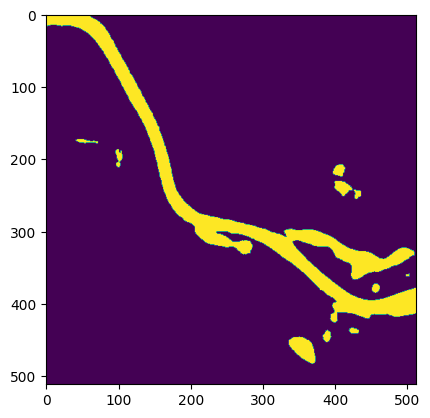

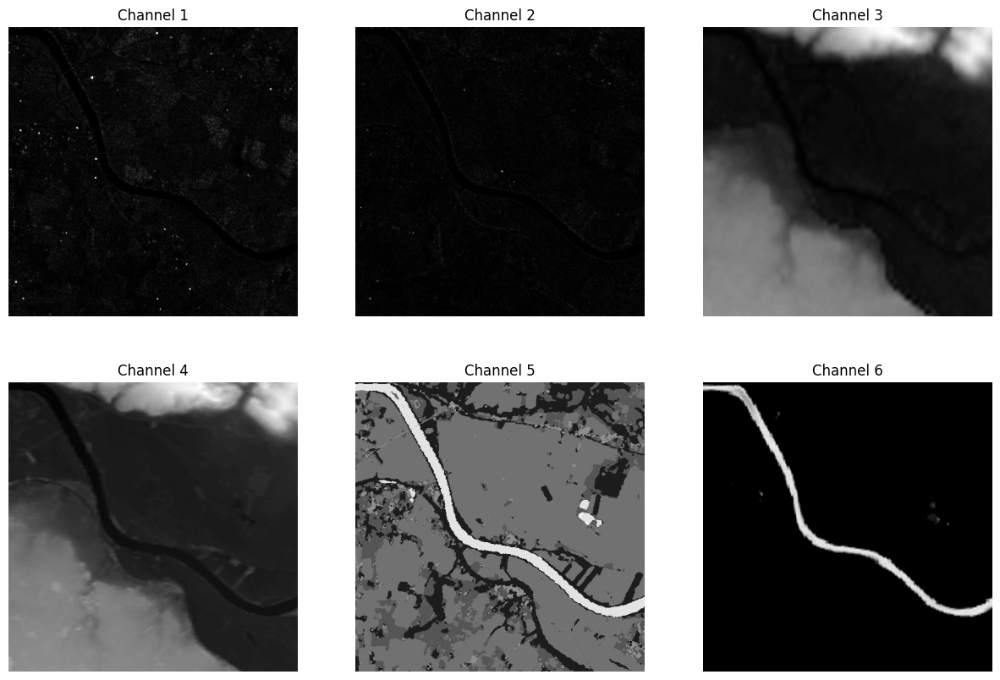

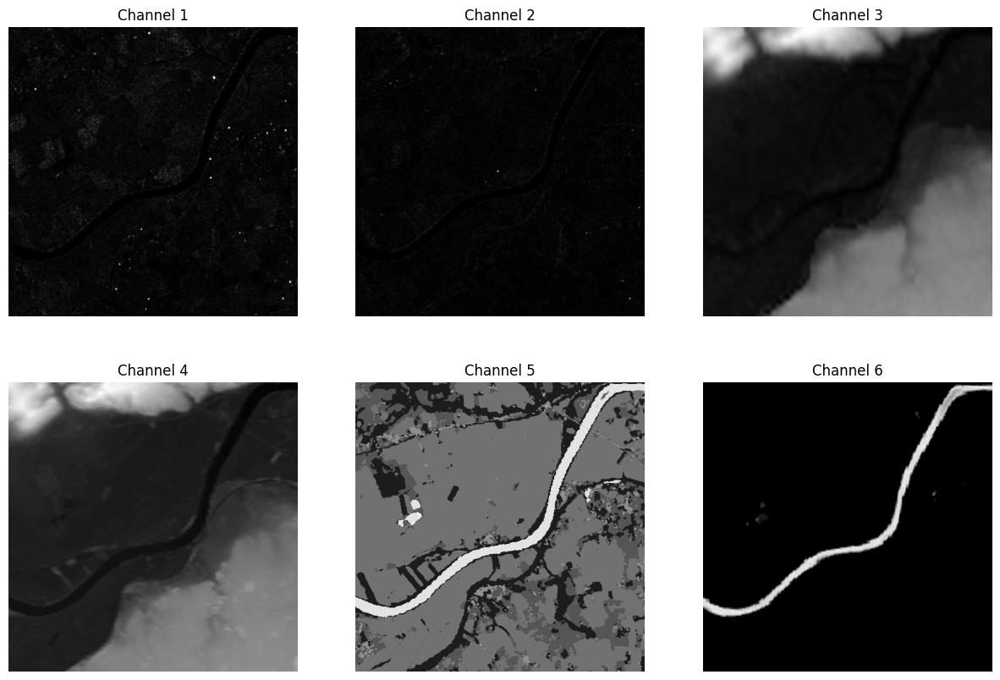

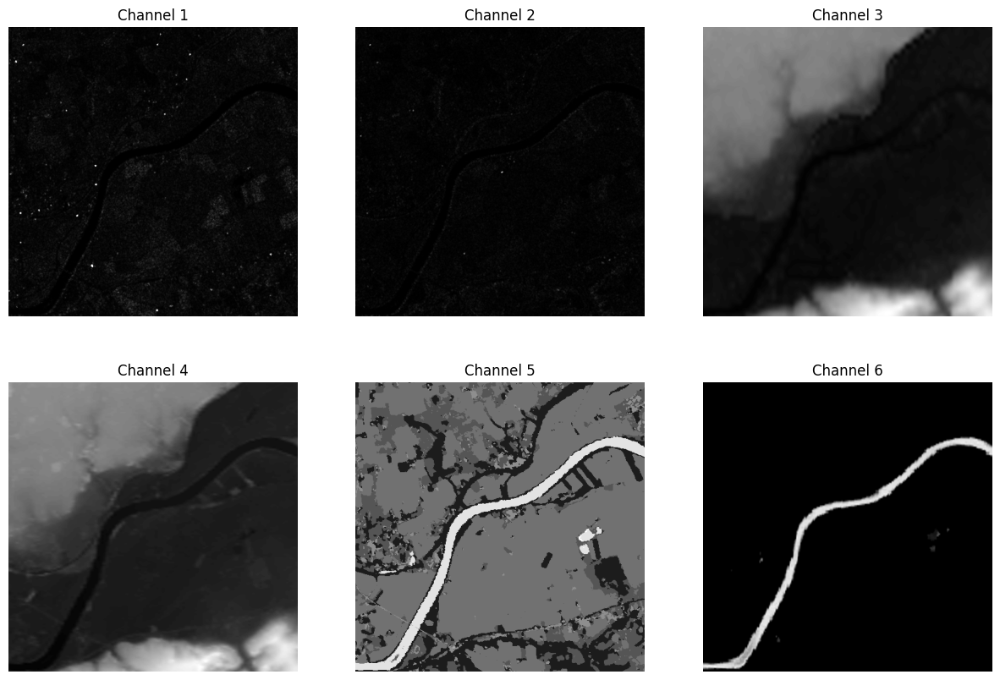

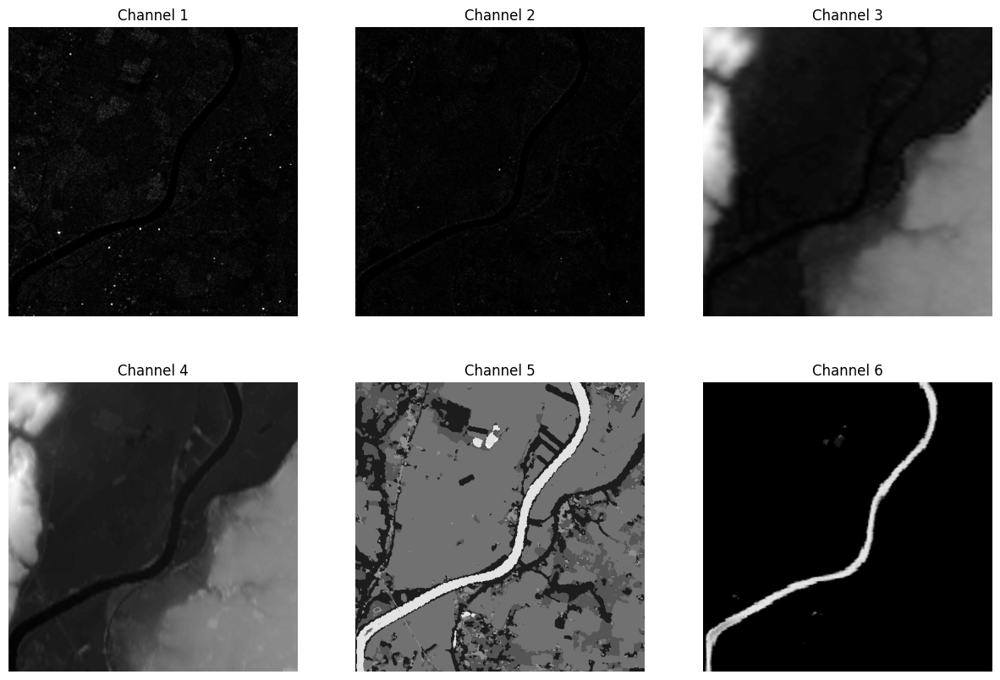

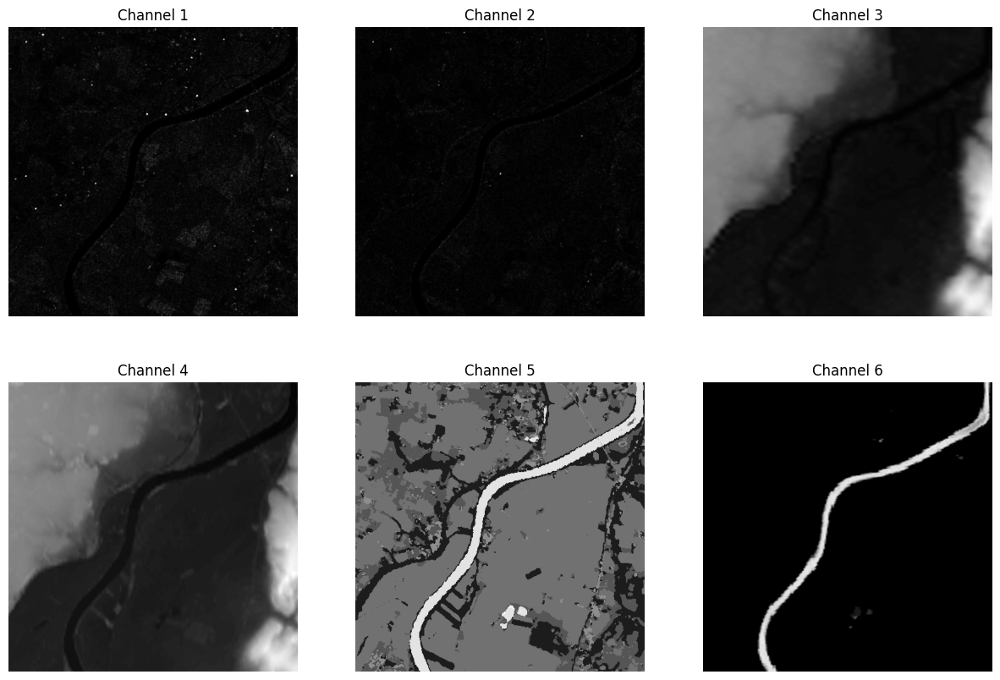

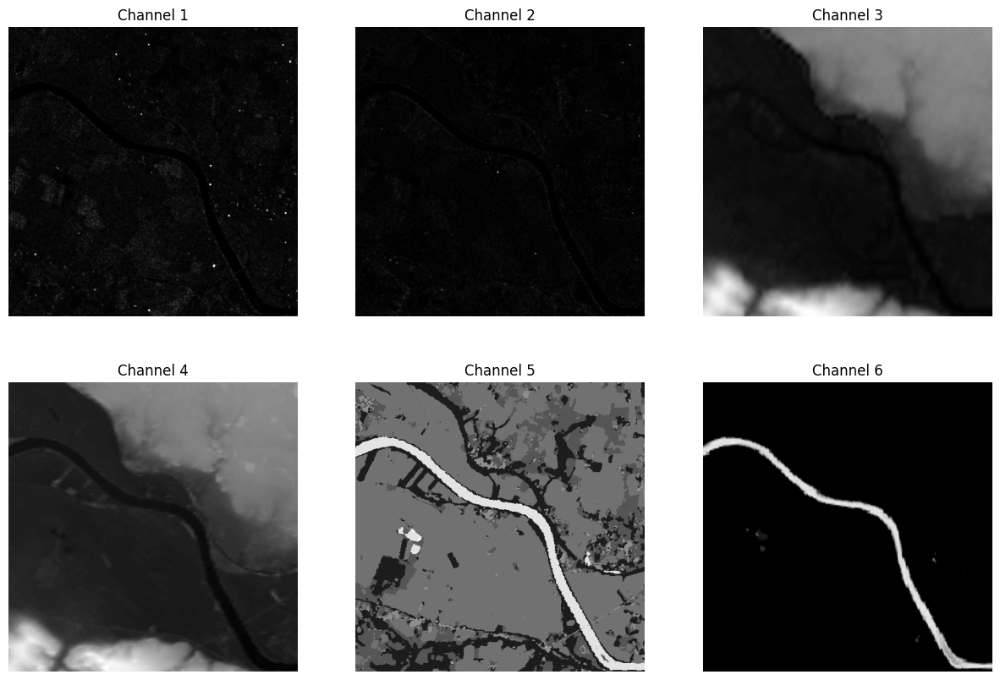

  0%|          | 0/349 [00:02<?, ?it/s]


In [41]:
image_root=pathlib.Path('/home/syo/work/2024_IEEE_GRSS/dataset/Track1/val/images/')
#image_root=pathlib.Path('/home/syo/work/2024_IEEE_GRSS/dataset/Track1/train/images/')
images_list = sorted(list(image_root.glob('*')))
thred=0.5

for i in tqdm(images_list):
    sar_data = rasterio.open(i).read()
    if NORMALIZATION:
        sar_data=_sar_normalization(sar_data=sar_data)
    with torch.no_grad():
        #sar_data=torch.tensor(sar_data,dtype=torch.float32).unsqueeze(0).cuda()
        tta(model=model1,input_data=sar_data)
        break